In [16]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *

In [17]:
def gaus2d(x=0, y=0, mx=0, my=0, sx=1, sy=1):
    return 1. / (2. * torch.pi * sx * sy) * torch.exp(-((x - mx)**2. / (2. * sx**2.) + (y - my)**2. / (2. * sy**2.)))

In [47]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T

wave_amp_coef = torch.tensor([30, 0., 0., 3, 3], requires_grad=True)

# coeffs = torch.rand(10, 1, requires_grad=True)
coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
# coeffs = torch.tensor([[ -13.53],
#         [-113.3250],
#         [ -12.7425],
#         [   4.4154],
#         [   6.2158],
#         [ -119.261],
#         [   2.3329],
#         [  1.3617],
#         [   1.5364],
#         [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

# target_abs = torch.real(torch.tensor(abs_img).T*torch.exp(1j*torch.tensor(phase_img).T))
# target_phase = torch.imag(torch.tensor(abs_img).T*torch.exp(1j*torch.tensor(phase_img).T))


cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(145.003) # mm 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': wave_amp_coef, 'lr': 1e-2},
    {'params': coeffs, 'lr': 10},
    {'params': cons, 'lr': 1e-2},
    # {'params': dist, 'lr': 1e-2}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=100, gamma=0.5)

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

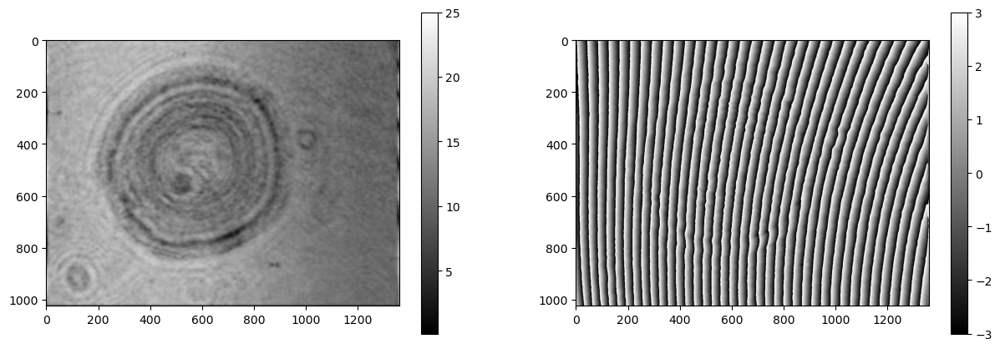

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm0 = axs[0].imshow(target_abs.detach().T.abs(), vmax=25,  cmap='gray')
cm1 = axs[1].imshow(target_phase.detach().T, vmax=3, vmin=-3, cmap='gray')
# , vmin=-3, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

In [49]:
# obj_amp.shape, obj_phase.shape, wave.shape, wave_at_img.shape, target_abs.shape

torch.abs(torch.tensor([-3, 2.]))

tensor([3., 2.])

0 1.3641763793834816


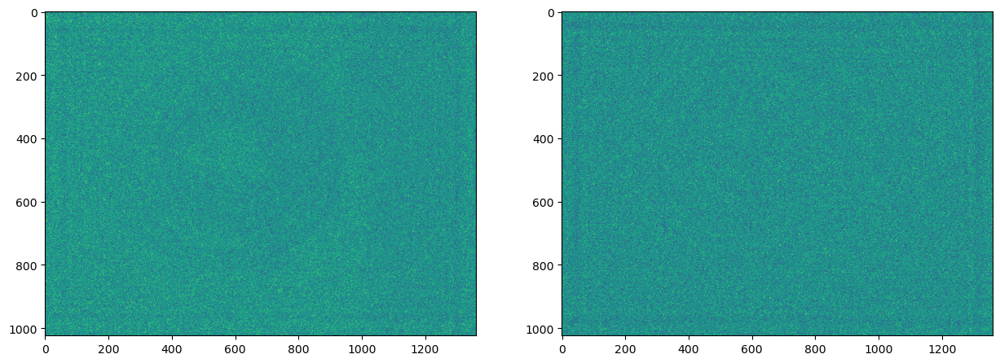

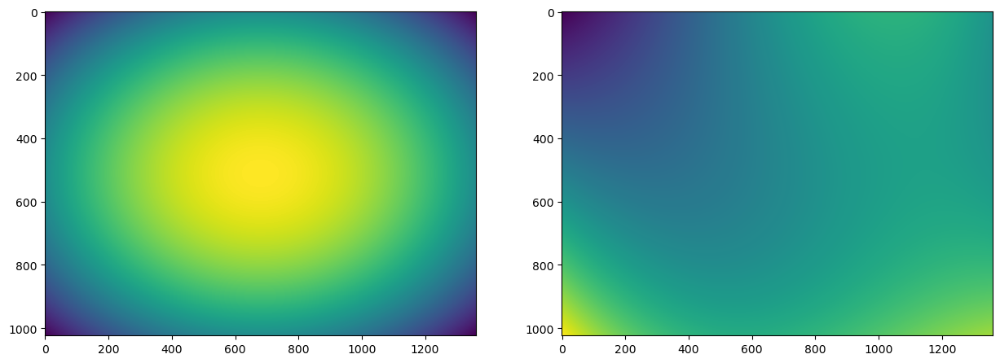

1 1.2366798290078234
2 1.1751718244344054
3 1.1566849260491598
4 1.1394207314851046
5 1.1161089818717063
6 1.0902582793557647
7 1.064457214854118
8 1.0377405881891004
9 1.0153812695404922
10 0.9969965284306852
11 0.9765726079354484
12 0.9593262498418081
13 0.9412380394856299
14 0.9293744302882423
15 0.9144253643154705
16 0.9012159901951221
17 0.8886727486202926
18 0.8761320674309137
19 0.8602921776917086
20 0.849123752434417
21 0.8378887258536025
22 0.8220753855549541
23 0.8113388311363801
24 0.7978402518137627
25 0.7858628531454281
26 0.7754024216608707
27 0.7636106463490268
28 0.7548482664185348
29 0.7550463264432967
30 0.7390981037439727
31 0.7253129790282986
32 0.7280865833894881
33 0.7102173721984275
34 0.7061702115356023
35 0.704279752579976
36 0.6857191070723739
37 0.6761806518302564
38 0.662473221713206
39 0.6540771434973147
40 0.6438621832417878
41 0.6353788472008793
42 0.641138281429322
43 0.6265311179049786
44 0.6226375639358868
45 0.6134570485613873
46 0.6074489519716223
47

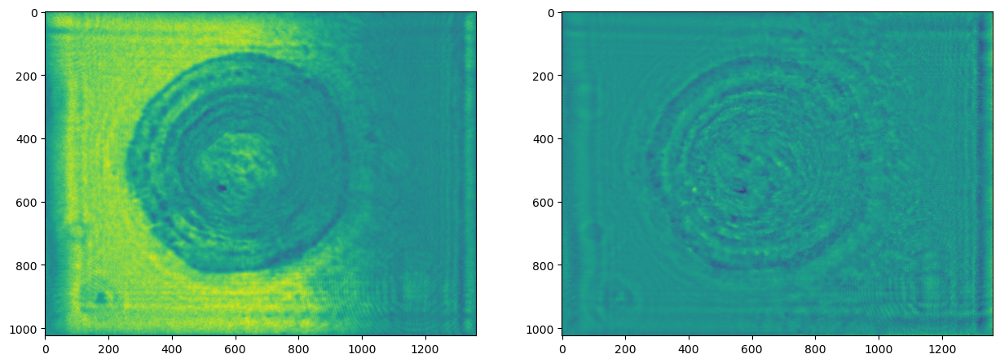

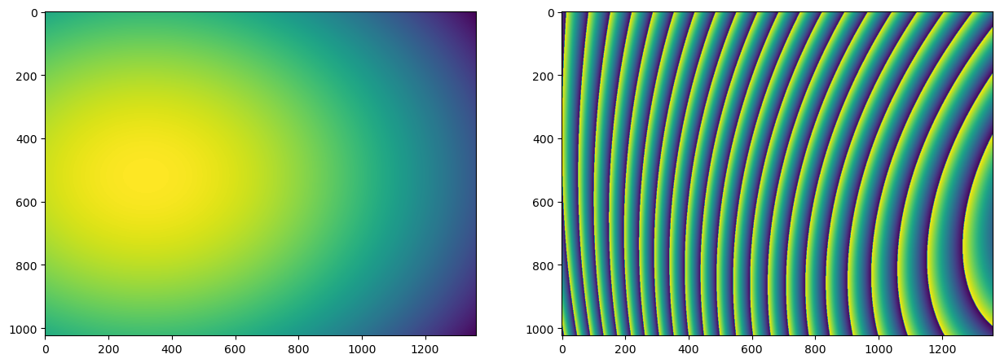

51 0.5725413057011004
52 0.5727074946139143
53 0.5618463623977635
54 0.5580811539676173
55 0.565030434195134
56 0.557225254396702
57 0.558963764870579
58 0.5581732242299833
59 0.5439425789646792
60 0.5562729864094187
61 0.5429907748553935
62 0.567399170277
63 0.5812112220030953
64 0.5721769445219123
65 0.5412733939970378
66 0.5494690937167439
67 0.5536611417008439
68 0.5331506924884543
69 0.5408912286994636
70 0.5483059907248778
71 0.5337365193778087
72 0.5236950563500276
73 0.5186901143290473
74 0.520941123480869
75 0.5203536576929928
76 0.509123949286821
77 0.5130890751784032
78 0.5080777052856722
79 0.4978541697229641
80 0.49743294769608914
81 0.4909985409713945
82 0.49476667376287486
83 0.5169475960386312
84 0.5143003754970841
85 0.49435046686568895
86 0.500838395746548
87 0.5137236884993133
88 0.4997740132596362
89 0.49972276203859556
90 0.5041971038985891
91 0.492205334700035
92 0.5106051356926834
93 0.49792118455492723
94 0.49709335477735395
95 0.49426128089786764
96 0.494260886

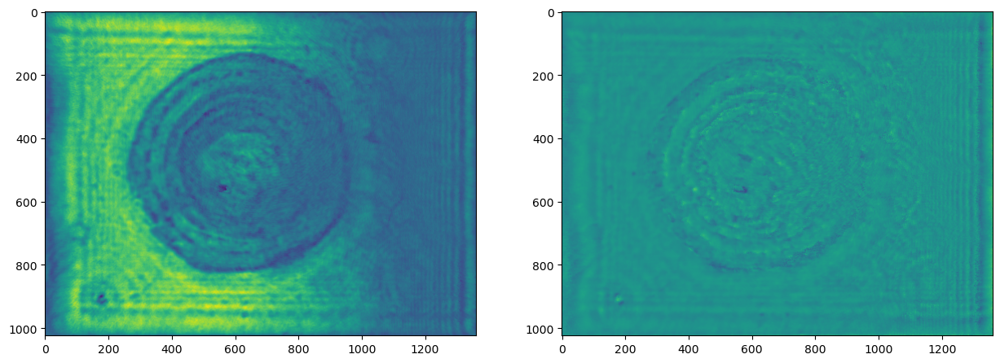

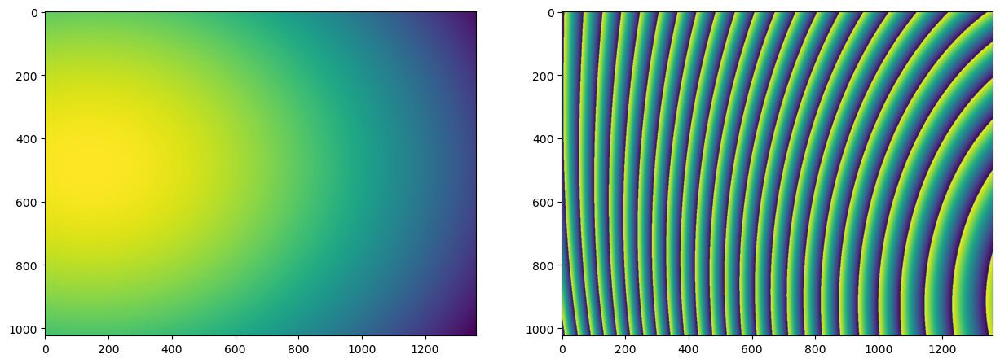

101 0.4670375528098824
102 0.45710231765689535
103 0.4545645319258913
104 0.45332733074361076
105 0.4493383370689626
106 0.45104279367708
107 0.44024579388768875
108 0.45286257973033606
109 0.4390587716000731
110 0.4414808083924364
111 0.43293231143848754
112 0.42663781515532523
113 0.42739563761246685
114 0.42893511640177345
115 0.4183175946452217
116 0.42252761431912467
117 0.41678839936686873
118 0.4101186965505626
119 0.4262309178830028
120 0.4102664132049898
121 0.4381926712742684
122 0.4229480872867762
123 0.4303343867797774
124 0.4368151395780814
125 0.42678957138786844
126 0.44073568359118526
127 0.4342417418380673
128 0.41583844750375104
129 0.44116755999582197
130 0.42878499748597376
131 0.4233048164726538
132 0.4235835551965695
133 0.42490609841077986
134 0.42295636836000516
135 0.4249551612688751
136 0.4221828308978676
137 0.4137797527120161
138 0.4240564610014075
139 0.4304009762792906
140 0.42878736077410395
141 0.4309935582767036
142 0.42409395994006693
143 0.42292499657

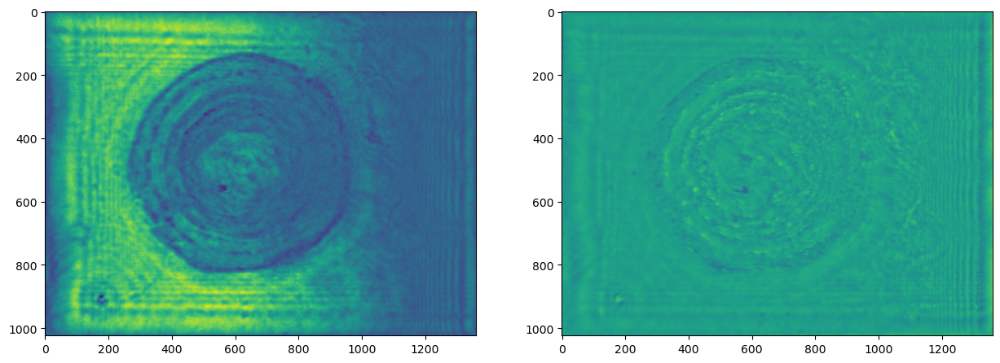

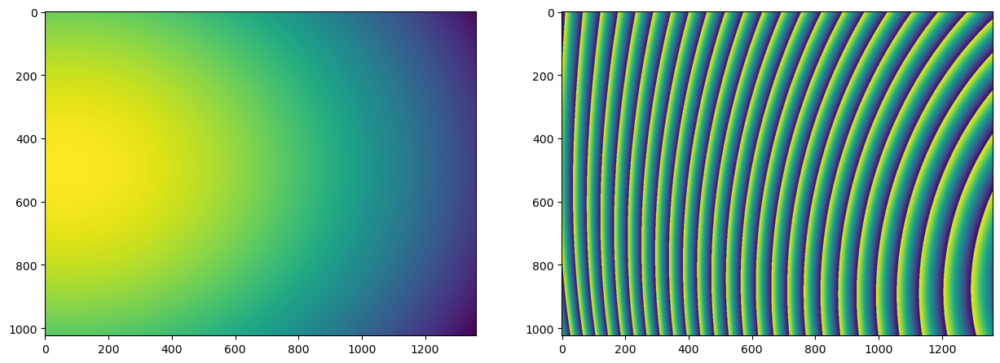

151 0.4127576039868201
152 0.4129794030334344
153 0.40962127563947376
154 0.3968416353659336
155 0.40459198326907575
156 0.4016194677478681
157 0.3947766294779373
158 0.39908445731592657
159 0.40672549660081353
160 0.39335232255580177
161 0.40925784550045036
162 0.39468892370627734
163 0.4002096576361363
164 0.3929422414520829
165 0.39035526944922283
166 0.3980630582441428
167 0.3922623123617376
168 0.3904517892214564
169 0.4013025804311301
170 0.38477004388331143
171 0.39108456581416456
172 0.3940253233323829
173 0.3930070363647003
174 0.38726213142605703
175 0.4035325797228815
176 0.39369559277856675
177 0.40648386825006366
178 0.40341773479232135
179 0.39275544413611163
180 0.39591459764623543
181 0.39798310214935373
182 0.39066115990769956
183 0.4152173216601192
184 0.3997574621522087
185 0.4148736033166785
186 0.4184905351407958
187 0.4166130301907362
188 0.40779384323916706
189 0.4174856569334862
190 0.4074541021244399
191 0.4108939774725824
192 0.4050044789826554
193 0.410548367

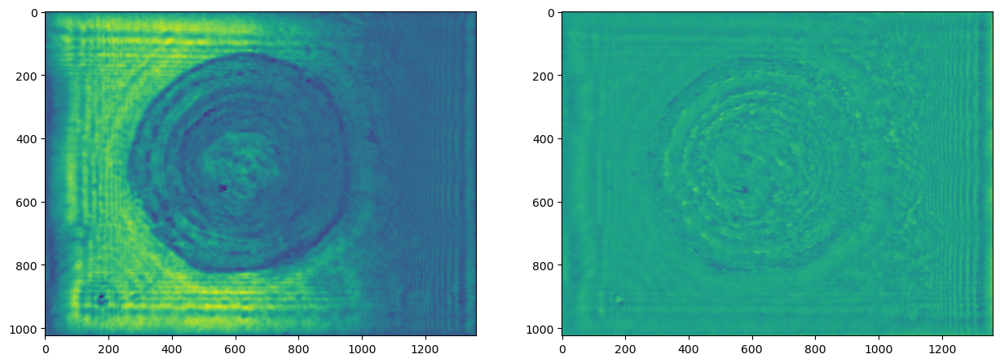

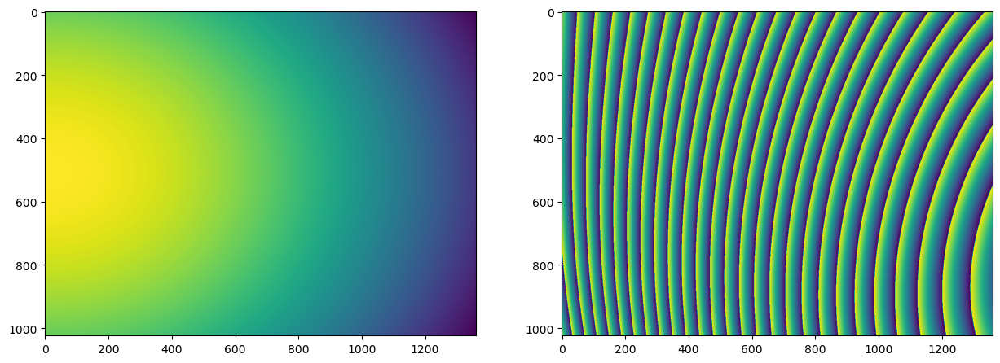

201 0.3930196216148229
202 0.38123655654209687
203 0.37932647389476193
204 0.37577537303546754
205 0.37411936934374
206 0.37238858555583454
207 0.3697350674878168
208 0.36638335186249665
209 0.3665337999559872
210 0.3630331136238588
211 0.3609335675822091
212 0.35906610681791795
213 0.3616851053007315
214 0.35637946797477515
215 0.35365397103023655
216 0.35130480328035796
217 0.3540050590707146
218 0.3546487393658692
219 0.34890679400167257
220 0.3504302527511407
221 0.35312995171587497
222 0.345813674090854
223 0.3473764623255219
224 0.35030942971657775
225 0.3433140568361864
226 0.34449461476227583
227 0.3504981360423237
228 0.34422851197667037
229 0.3480709204836465
230 0.345947457248041
231 0.3456387490833849
232 0.3511559799331009
233 0.3430257138977676
234 0.34151586209571905
235 0.3497003173950097
236 0.35346607138680564
237 0.3462779308841691
238 0.3536147047138948
239 0.35570903244452046
240 0.35693358406015674
241 0.3504979753931061
242 0.35440833945118366
243 0.3667159933676

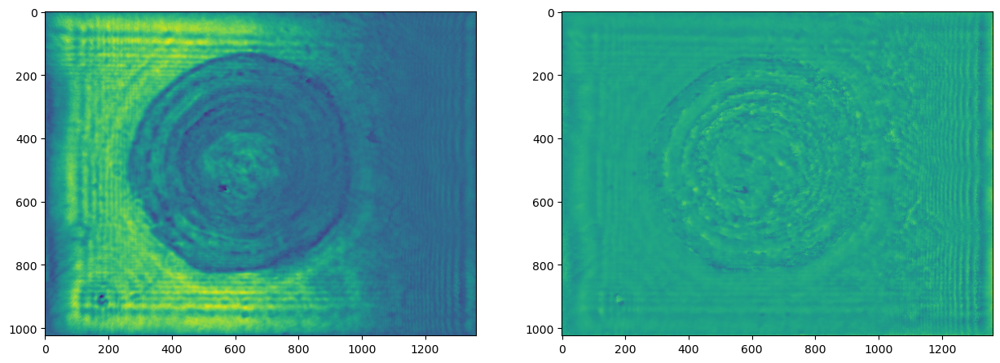

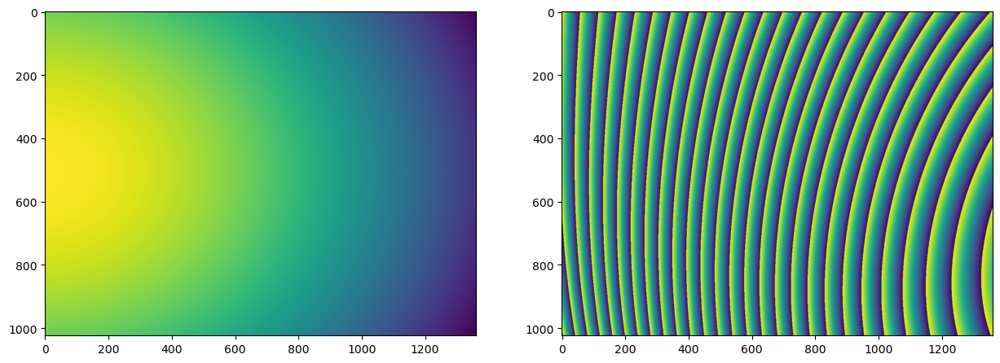

251 0.3601916335341339
252 0.36324888049244847
253 0.3553478026565131
254 0.35403344737267894
255 0.36695156907463816
256 0.3617600820211779
257 0.3571077751241009
258 0.35485452825763897
259 0.35309683037129314
260 0.3526790159538906
261 0.35063739937653543
262 0.3472588889687608
263 0.3523239998500144
264 0.35890605125088165
265 0.3493911670237628
266 0.3595396017340388
267 0.3513345525700595
268 0.35834233292016937
269 0.3515021081323916
270 0.3575042398516646
271 0.34761211562918004


KeyboardInterrupt: 

In [50]:
epochs = 501

loss_arr = []
loss_amp_arr = []
loss_phase_arr = []
loss_tv_amp_arr = []
loss_tv_phase_arr = []

wave_amp_coeff_train = []
wave_phase_coeff_train = []

norm_target_abs = 6*(target_abs - target_abs.min())/(target_abs.max() - target_abs.min()) - 3

for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    # obj = obj_amp + 1j*obj_phase
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)

    wave_amp = wave_amp_coef[0]*gaus2d(torch.tensor(X), torch.tensor(Y), wave_amp_coef[1], wave_amp_coef[2], wave_amp_coef[3], wave_amp_coef[4]).T
    wave = wave_amp*torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    # wave_z += cons
    
    loss_phase = loss_fn(torch.angle(wave_at_img), target_phase)
    # loss_amp = torch.pow(torch.abs(wave_at_img) - norm_target_abs, 2).sum()/obj_amp.ravel().size()[0]
    loss_amp = torch.abs(torch.abs(wave_at_img) - norm_target_abs).sum()/obj_amp.ravel().size()[0]
    # loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)
    loss_TV_phase = total_variation_loss(obj_phase, 0.2, l=0, th=0.2)
    loss_TV_amp = total_variation_loss(obj_amp, 0.1, l=2)

    loss = loss_amp + loss_phase +  loss_TV_amp + loss_TV_phase

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()
    scheduler.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    loss_amp_arr.append(loss_amp.item())
    loss_phase_arr.append(loss_phase.item())
    loss_tv_amp_arr.append(loss_TV_amp.item())
    loss_tv_phase_arr.append(loss_TV_phase.item())

    wave_amp_coeff_train.append(wave_amp_coef.detach().clone())
    # print(wave_amp_coef.detach())
    wave_phase_coeff_train.append(coeffs.detach().clone())

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[1].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[0].imshow(obj_amp.detach())
        # axs[1].imshow(torch.angle(obj.detach()))
        # # axs[1].imshow(proc.detach())
        # axs[0].imshow(torch.abs(obj.detach()))
        plt.show()

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[1].imshow(torch.angle(wave.detach()))
        # axs[1].imshow(proc.detach())
        axs[0].imshow(torch.abs(wave.detach()))
        plt.show()
        

In [ ]:
# wave_amp.shape, wave_amp_coef, wave_amp_coef.grad

In [ ]:
# dist, cons.grad, coeffs.grad, coeffs

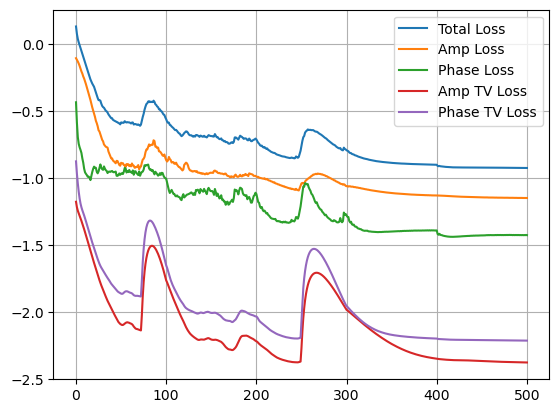

In [37]:
plt.plot(np.log10(loss_arr), label='Total Loss')
plt.plot(np.log10(loss_amp_arr), label='Amp Loss')
plt.plot(np.log10(loss_phase_arr), label='Phase Loss')
plt.plot(np.log10(loss_tv_amp_arr), label='Amp TV Loss')
plt.plot(np.log10(loss_tv_phase_arr), label='Phase TV Loss')

plt.legend()
plt.grid()

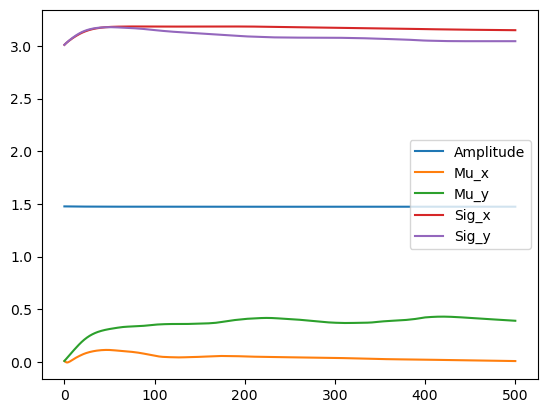

In [24]:
plt.plot(torch.log10(torch.stack(wave_amp_coeff_train)[:, 0]), label='Amplitude')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 1], label='Mu_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 2], label='Mu_y')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 3], label='Sig_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 4], label='Sig_y')
plt.legend()

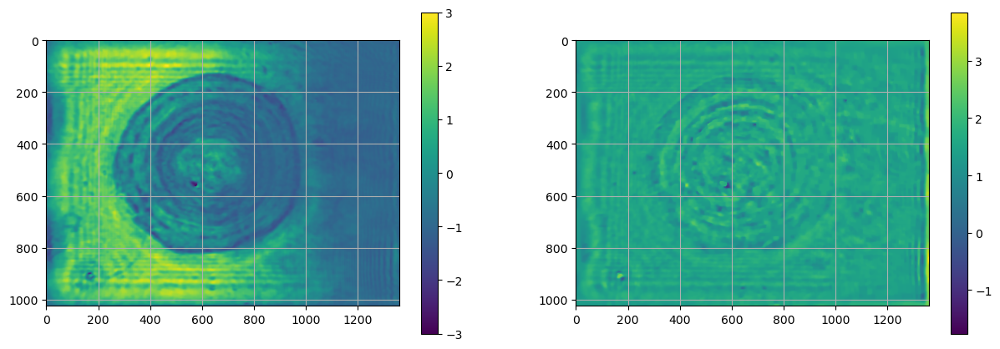

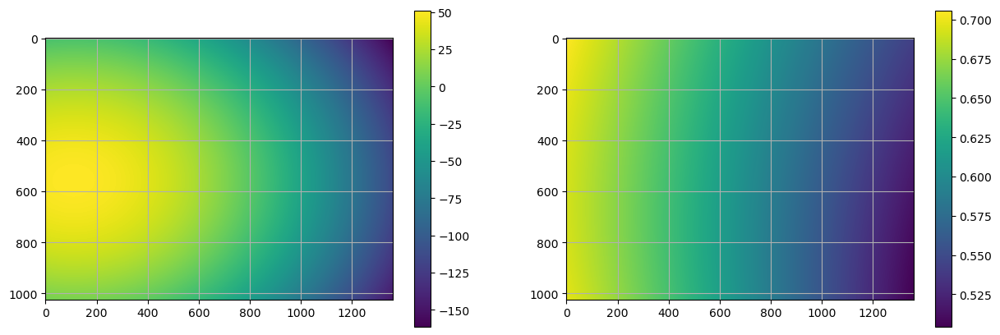

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(obj_amp.detach())
cm0 = axs[1].imshow(obj_phase.detach(), vmin=-3, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()


fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(wave_amp.detach())
cm0 = axs[1].imshow(wave_phase.detach())
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

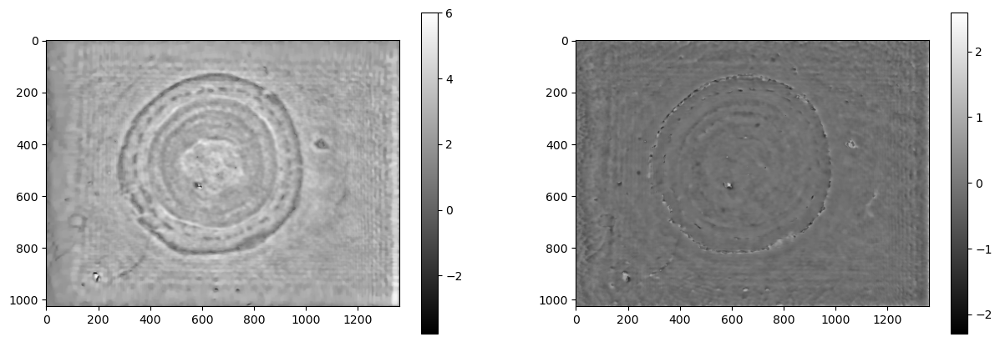

In [11]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[0].imshow(obj_amp.detach(), cmap='gray')
cm0 = axs[1].imshow(obj_phase.detach(), cmap='gray')
# , vmin=-3, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

# axs[0].grid()
# axs[1].grid()

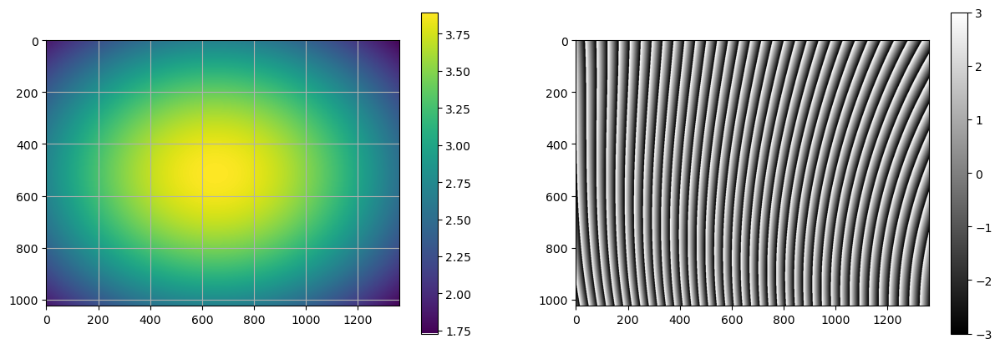

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm0 = axs[0].imshow(wave_amp.detach())
cm1 = axs[1].imshow(torch.angle(wave).detach(), vmax=3, vmin=-3, cmap='gray')
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
# axs[1].grid()

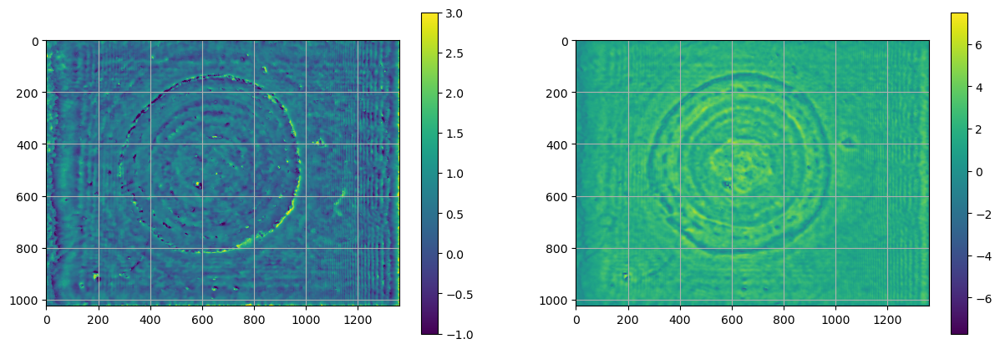

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

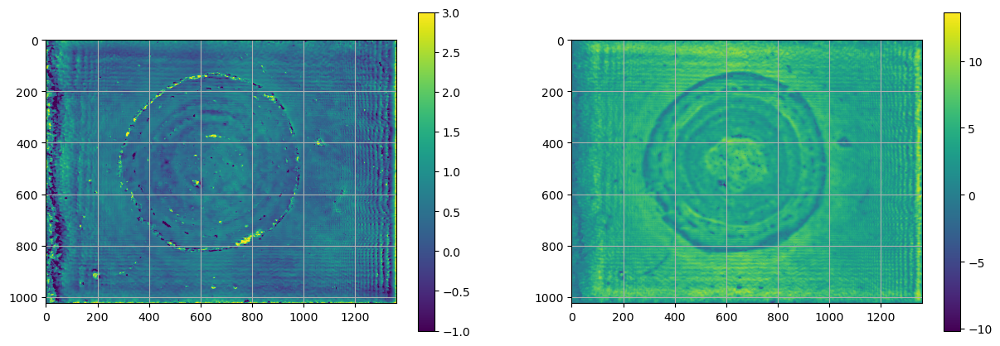

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

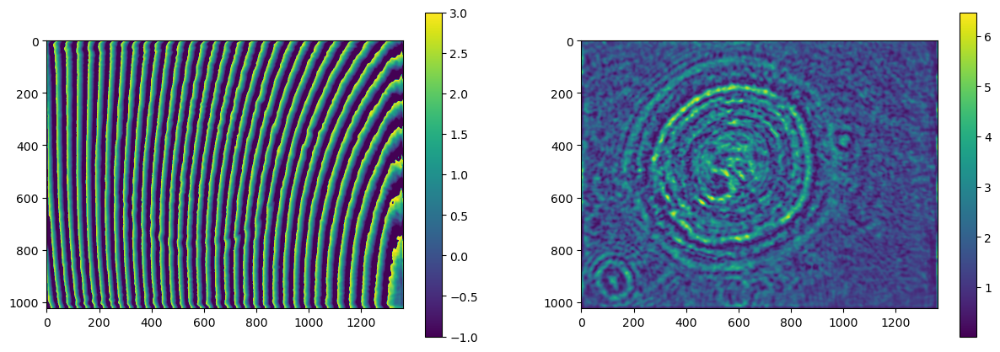

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

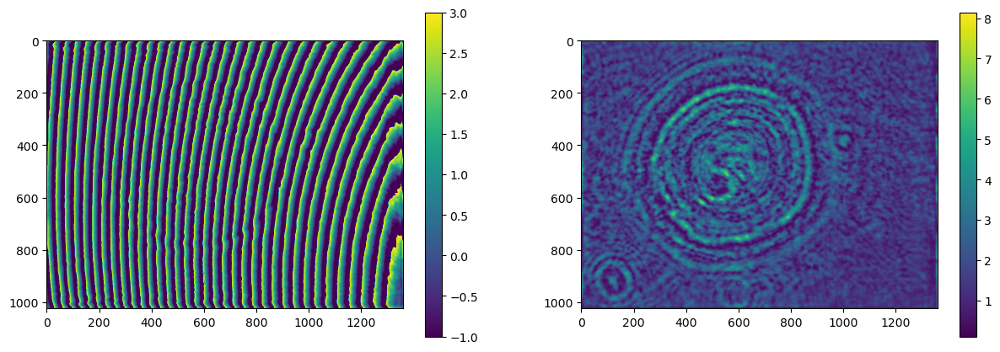

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

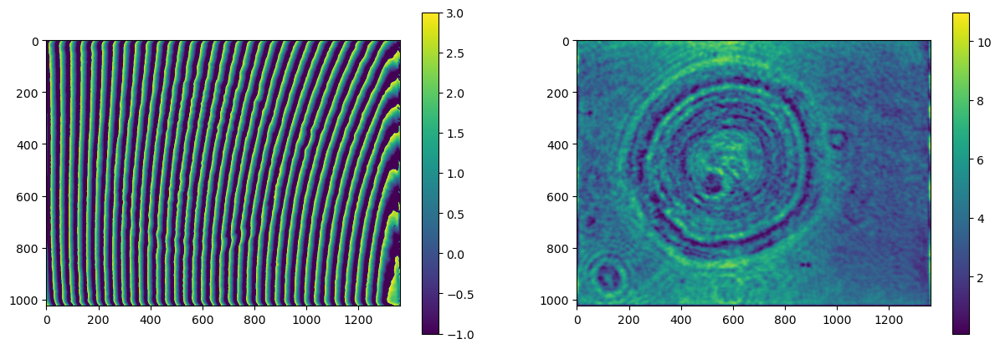

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

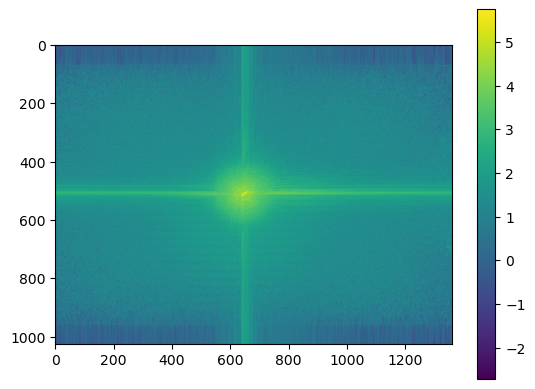

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

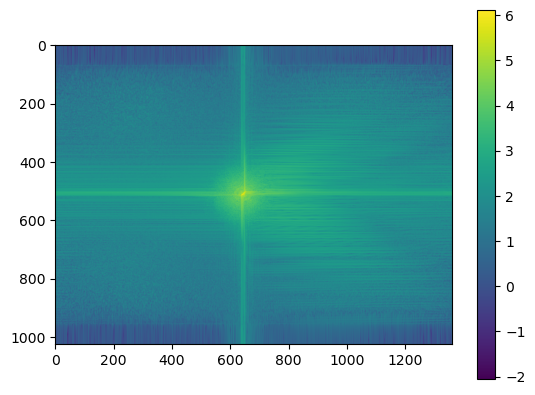

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

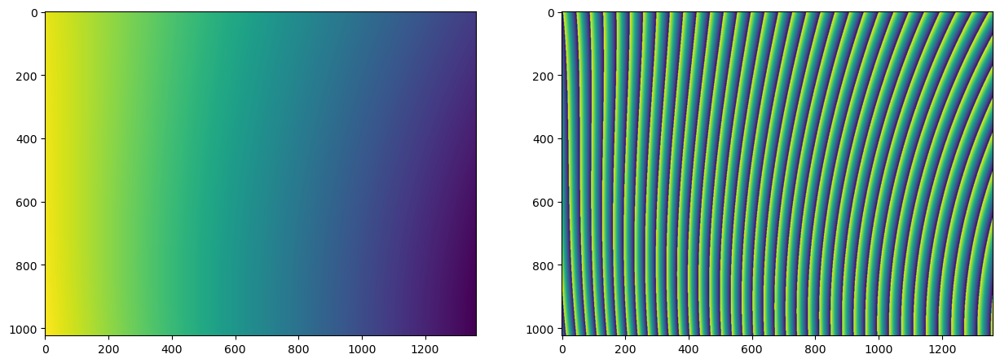

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

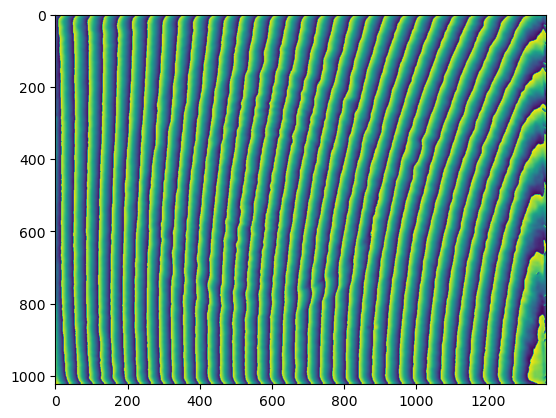

In [ ]:
plt.imshow(wave_z.detach().T)

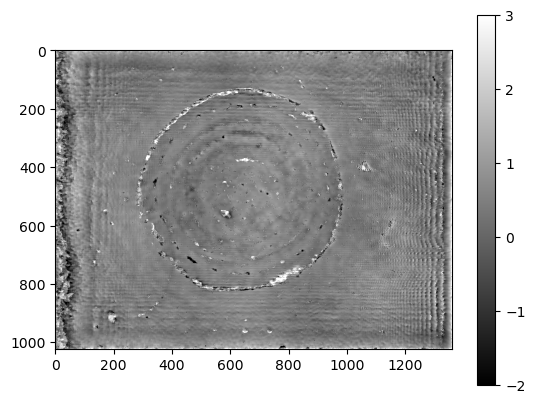

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()